In [2]:
%run to_import.py
%matplotlib inline

In [4]:
segm_set=range(1,13)
data_folder='../../Data_Raw'
data_small='../../Data_Small_Tables'

### calculate and plot varince as function of read frequency

In [5]:
def plot_variance(dfmv,segment):
    plt.rcParams.update({'font.size': 48})
    fig=plt.figure(figsize=(20.3*3,20.4*3))
    plt.subplots_adjust(hspace = 0.4,wspace=0.3)
    plt.suptitle('S'+str(segment),fontsize=96)
    count=1
    for t in ['t0','t1','t2']:
        xmax=max(map(lambda x:max(x),list(dfmv.loc[t,['tech1_bio1_tech2_bio1_m', 'tech1_bio2_tech2_bio2_m', 'tech1_bio1_tech1_bio2_m',\
                               'tech1_bio1_tech2_bio2_m', 'tech2_bio1_tech1_bio2_m', 'tech2_bio1_tech2_bio2_m']])))
        xnew=np.arange(0,xmax,0.01)
        ynewt=(dfmv.loc[t,'tech1_bio1_tech2_bio1_i'](xnew)+dfmv.loc[t,'tech1_bio2_tech2_bio2_i'](xnew))/2.
        ynewb=(dfmv.loc[t,'tech1_bio1_tech1_bio2_i'](xnew)+dfmv.loc[t,'tech1_bio1_tech2_bio2_i'](xnew)\
               +dfmv.loc[t,'tech2_bio1_tech1_bio2_i'](xnew)+dfmv.loc[t,'tech2_bio1_tech2_bio2_i'](xnew))/4.


        plt.subplot(3,3,count)
        plt.plot(xnew,(ynewb*4-ynewt*2)/16,c='black',linewidth=3)
        print xnew[0],((ynewb*4-ynewt*2)/16)[0]
        plt.title(t+': '+r'$\sigma^2$'+' of '+r'$\mu(frequency)$')
        plt.xlabel(r'$frequency,*10^{-6}$')
        plt.ylabel(r'$\sigma^{2}(frequency),*10^{-12}$')
        plt.legend([r'($\sum_{}^4 \sigma^{2}_{b_i}-\sum_{}^2 \sigma^{2}_{t_i})/16=(4*\bar{\sigma}^{2}_b-2*\bar{\sigma}^{2}_t)/16$']\
                   ,fontsize=36,loc=2)
        plt.ylim(0)
        plt.xlim(0)

        plt.subplot(3,3,count+3)
        plt.scatter(dfmv.loc[t,'tech1_bio1_tech2_bio1_m'],dfmv.loc[t,'tech1_bio1_tech2_bio1_v'],edgecolors='',s=40,c='b')
        plt.scatter(dfmv.loc[t,'tech1_bio2_tech2_bio2_m'],dfmv.loc[t,'tech1_bio2_tech2_bio2_v'],edgecolors='',s=40,c='r')
        plt.plot(xnew,dfmv.loc[t,'tech1_bio1_tech2_bio1_i'](xnew),c='b')
        plt.plot(xnew,dfmv.loc[t,'tech1_bio2_tech2_bio2_i'](xnew),c='r')
        plt.plot(xnew,ynewt,c='black',linewidth=3)
        plt.title(t+': '+r'$\sigma^2$'+' between tech replicas')
        plt.xlabel(r'$frequency,*10^{-6}$')
        plt.ylabel(r'$\sigma^{2}(frequency),*10^{-12}$')
        plt.legend(['t1b1_t2b1','t1b2_t2b2'],loc=2)
        plt.ylim(0)
        plt.xlim(0)

        plt.subplot(3,3,count+6)
        plt.plot(xnew,dfmv.loc[t,'tech1_bio1_tech1_bio2_i'](xnew),c='b')
        plt.plot(xnew,dfmv.loc[t,'tech1_bio1_tech2_bio2_i'](xnew),c='r')
        plt.plot(xnew,dfmv.loc[t,'tech2_bio1_tech1_bio2_i'](xnew),c='g')
        plt.plot(xnew,dfmv.loc[t,'tech2_bio1_tech2_bio2_i'](xnew),c='magenta')  

        plt.scatter(dfmv.loc[t,'tech1_bio1_tech1_bio2_m'],dfmv.loc[t,'tech1_bio1_tech1_bio2_v'],edgecolors='',s=20,c='b')
        plt.scatter(dfmv.loc[t,'tech1_bio1_tech2_bio2_m'],dfmv.loc[t,'tech1_bio1_tech2_bio2_v'],edgecolors='',s=20,c='r')
        plt.scatter(dfmv.loc[t,'tech2_bio1_tech1_bio2_m'],dfmv.loc[t,'tech2_bio1_tech1_bio2_v'],edgecolors='',s=20,c='g')
        plt.scatter(dfmv.loc[t,'tech2_bio1_tech2_bio2_m'],dfmv.loc[t,'tech2_bio1_tech2_bio2_v'],edgecolors='',s=20,c='magenta')

        plt.plot(xnew,ynewb,c='black',linewidth=3)
        plt.title(t+': '+r'$\sigma^2$'+' between bio repl')
        plt.xlabel(r'$frequency,*10^{-6}$')
        plt.ylabel(r'$\sigma^{2}(frequency),*10^{-12}$')
        plt.legend(['t1b1_t1b2','t1b1_t2b2','t2b1_t1b2','t2b1_t2b2'],loc=2)
        plt.ylim(0)
        plt.xlim(0)
        #plt.ylim(0,1.05*max([max(df.loc[t,'_tech1_bio1_tech1_bio2_v']),max(df.loc[t,'_tech1_bio1_tech2_bio2_v']),max(df.loc[t,'_tech2_bio1_tech1_bio2_v']),max(df.loc[t,'_tech2_bio1_tech2_bio2_v'])]))
        count+=1
    return fig

In [6]:
def calculate_variance(replicas,s): 
    mask=replicas.copy()
    dfmv=pd.DataFrame(columns=['tech1_bio1_tech2_bio1_m', 'tech1_bio2_tech2_bio2_m', 'tech1_bio1_tech1_bio2_m',\
                               'tech1_bio1_tech2_bio2_m', 'tech2_bio1_tech1_bio2_m', 'tech2_bio1_tech2_bio2_m',\
                               'tech1_bio1_tech2_bio1_v', 'tech1_bio2_tech2_bio2_v', 'tech1_bio1_tech1_bio2_v',\
                               'tech1_bio1_tech2_bio2_v', 'tech2_bio1_tech1_bio2_v', 'tech2_bio1_tech2_bio2_v'\
                              ],index=['t0','t1','t2'])

    for t in ['t0','t1','t2']:
        for reps in [['tech1_bio1','tech2_bio1'],['tech1_bio2','tech2_bio2'],\
    ['tech1_bio1','tech1_bio2'],['tech1_bio1','tech2_bio2'],['tech2_bio1','tech1_bio2'],['tech2_bio1','tech2_bio2']]:
            r1=t+'_'+reps[0]+'_fr'
            r2=t+'_'+reps[1]+'_fr'
            mask['tmp_mean']=(mask.loc[:,r1]+mask.loc[:,r2])/2
            mask['tmp_var']=((mask.loc[:,r1]-mask.loc[:,r2])**2)
            mask2=mask[(mask['tmp_mean']!=max(mask['tmp_mean']))&(mask['tmp_mean']!=0)] 
            #because for mean frequency==0 estimated var would be 0. I rather set it equal to binomial error for n_reads=0.5
            mask2=mask2.sort_values(by='tmp_mean')
            
            
            x_bin_min=10.**6/readsum.loc[t+'_'+reps[0],'S'+str(s)]+10.**6/readsum.loc[t+'_'+reps[1],'S'+str(s)]
            x_per_bin_min=5000
            x_edges0=np.arange(0,len(mask2),x_per_bin_min)
            x_previous=mask2.iloc[x_edges0[0]]['tmp_mean']
            x_edges=[x_edges0[0]]
            tmp=[x_previous]
            for i in x_edges0:
                if ((mask2.iloc[i]['tmp_mean']-x_previous)>x_bin_min):
                    x_edges.append(i)
                    x_previous=mask2.iloc[i]['tmp_mean']

            m=[0]
            v=[((0.5*(10.**6)/readsum.loc[t+'_'+reps[0],'S'+str(s)])**2+(0.5*(10.**6)/readsum.loc[t+'_'+reps[1],'S'+str(s)])**2)/2.]
            for i in range(len(x_edges)-1):
                mask3=mask2.iloc[x_edges[i]:x_edges[i+1]] # the max element will not be included
                m.append(np.mean(mask3['tmp_mean']))
                v.append(np.mean(mask3['tmp_var'])) 

            m=np.array(m)
            m=m[~np.isnan(m)]
            v=np.array(v)
            v=v[~np.isnan(v)]
            dfmv.loc[t,reps[0]+'_'+reps[1]+'_m']=m
            dfmv.loc[t,reps[0]+'_'+reps[1]+'_v']=v
    return dfmv
            

In [8]:
#download data
replicas_all=range(13)
start=time.time()
for segment in segm_set:
    replicas_all[segment]=pd.read_csv(data_folder+'/S'+str(segment)+'_merged_filtered_sum_10_size_4.csv',sep='\t',index_col=0)
    end=time.time()
    print segment, (end-start)
    start=end
    
readsum=pd.read_csv(data_small+'/readsum_all.csv', sep='\t',index_col=0)

1 2.80099987984
2 2.26200008392
3 3.62599992752
4 2.72699999809
5 4.21200013161
6 1.44199991226
7 0.968999862671
8 1.16000008583
9 0.851999998093
10 1.29600000381
11 1.02500009537
12 1.37199997902


In [9]:
#calculate frequencies, no demultiplex correction (in filtering we set to 0 everything with #read<min_read_tech)
#now I do this
for segment in segm_set:
    for t in ['t0','t1','t2']:
        for tech in [1,2]:
            for bio in [1,2]:
                replicas_all[segment][t+'_tech'+str(tech)+'_bio'+str(bio)+'_fr']=\
                replicas_all[segment][t+'_tech'+str(tech)+'_bio'+str(bio)]*(10.**6)/\
                 readsum.loc[t+'_tech'+str(tech)+'_bio'+str(bio),'S'+str(segment)]
        
        replicas_all[segment][t+'_fr_mean']=\
            np.nanmean(replicas_all[segment][[t+'_tech1_bio1_fr',t+'_tech1_bio2_fr',t+'_tech2_bio1_fr',t+'_tech2_bio2_fr']],axis=1)
        replicas_all[segment][t+'_fr_median']=\
            np.nanmedian(replicas_all[segment][[t+'_tech1_bio1_fr',t+'_tech1_bio2_fr',t+'_tech2_bio1_fr',t+'_tech2_bio2_fr']],axis=1)
        replicas_all[segment][t+'_fr']=np.where(abs(replicas_all[segment][t+'_fr_mean']-replicas_all[segment][t+'_fr_median'])\
                                                <replicas_all[segment][t+'_fr_median'],\
                                              replicas_all[segment][t+'_fr_mean'],replicas_all[segment][t+'_fr_median'])

In [ ]:
#calculate frequencies substructing demultiplex 
for segment in segm_set:
    for t in ['t0','t1','t2']:
        for tech in [1,2]:
            for bio in [1,2]:
                replicas_all[segment][t+'_tech'+str(tech)+'_bio'+str(bio)+'_fr']=\
                (replicas_all[segment][t+'_tech'+str(tech)+'_bio'+str(bio)]-0.5*replicas_all[segment]['min_read_tech'+str(tech)])\
                .map(lambda x: max(0,x))*(10.**6)/readsum.loc[t+'_tech'+str(tech)+'_bio'+str(bio),'S'+str(segment)]
        
        replicas_all[segment][t+'_fr_mean']=\
            np.nanmean(replicas_all[segment][[t+'_tech1_bio1_fr',t+'_tech1_bio2_fr',t+'_tech2_bio1_fr',t+'_tech2_bio2_fr']],axis=1)
        replicas_all[segment][t+'_fr_median']=\
            np.median(replicas_all[segment][[t+'_tech1_bio1_fr',t+'_tech1_bio2_fr',t+'_tech2_bio1_fr',t+'_tech2_bio2_fr']],axis=1)
        replicas_all[s][t+'_fr']=np.where(abs(replicas_all[s][t+'_fr_mean']-replicas_all[s][t+'_fr_median'])<replicas_all[s][t+'_fr_mean'],\
                                              replicas_all[s][t+'_fr_mean'],replicas_all[s][t+'_fr_median'])

1
1 13.9079999924
0.0 0.000208189866857
0.0 0.000289043855396
0.0 0.000195775772054
1 4.54800009727
2
2 10.381000042
0.0 0.000229847893246
0.0 0.000373293000135
0.0 0.000159743740637
2 4.44799995422
3
3 22.5920000076
0.0 0.000237923036041
0.0 0.000175394954674
0.0 0.000272924337482
3 4.71499991417
4
4 12.8339998722
0.0 0.000389854138272
0.0 0.000776760476204
0.0 0.000186189937618
4 5.78699994087
5
5 22.3250000477
0.0 0.000245636461093
0.0 0.000181785793843
0.0 0.000241060942952
5 5.66899991035
6
6 6.01999998093
0.0 0.000200606788936
0.0 0.000321234364307
0.0 0.000241602057388
6 4.83299994469
7
7 3.80900001526
0.0 0.00234290318766
0.0 0.000146043837489
0.0 0.000514323521044
7 4.1400001049
8
8 4.17499995232
0.0 0.00122846011071
0.0 0.00102012858513
0.0 0.000686555519022
8 4.20900011063
9
9 3.13899993896
0.0 0.000105521898092
0.0 0.00170861628634
0.0 0.000119886549798
9 4.46799993515
10
10 6.52399992943
0.0 0.000141973528758
0.0 0.000178464556963
0.0 0.000158639135799
10 4.21799993515
11


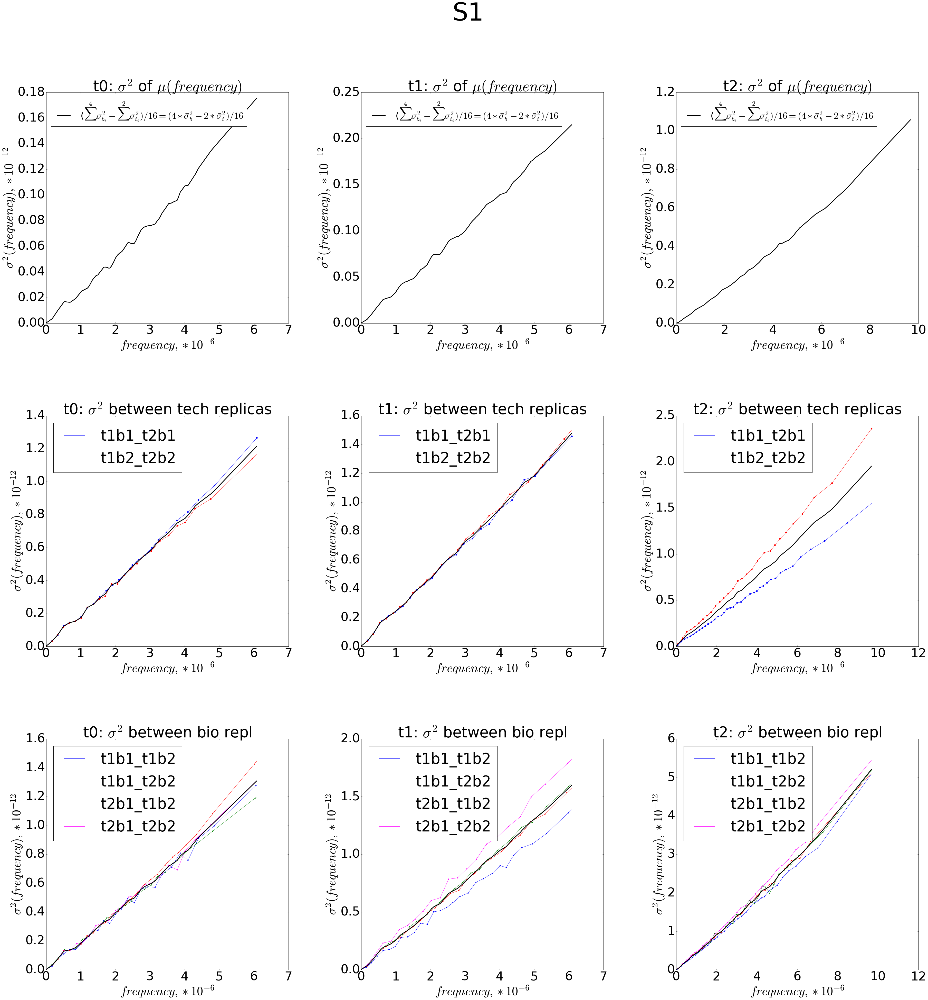

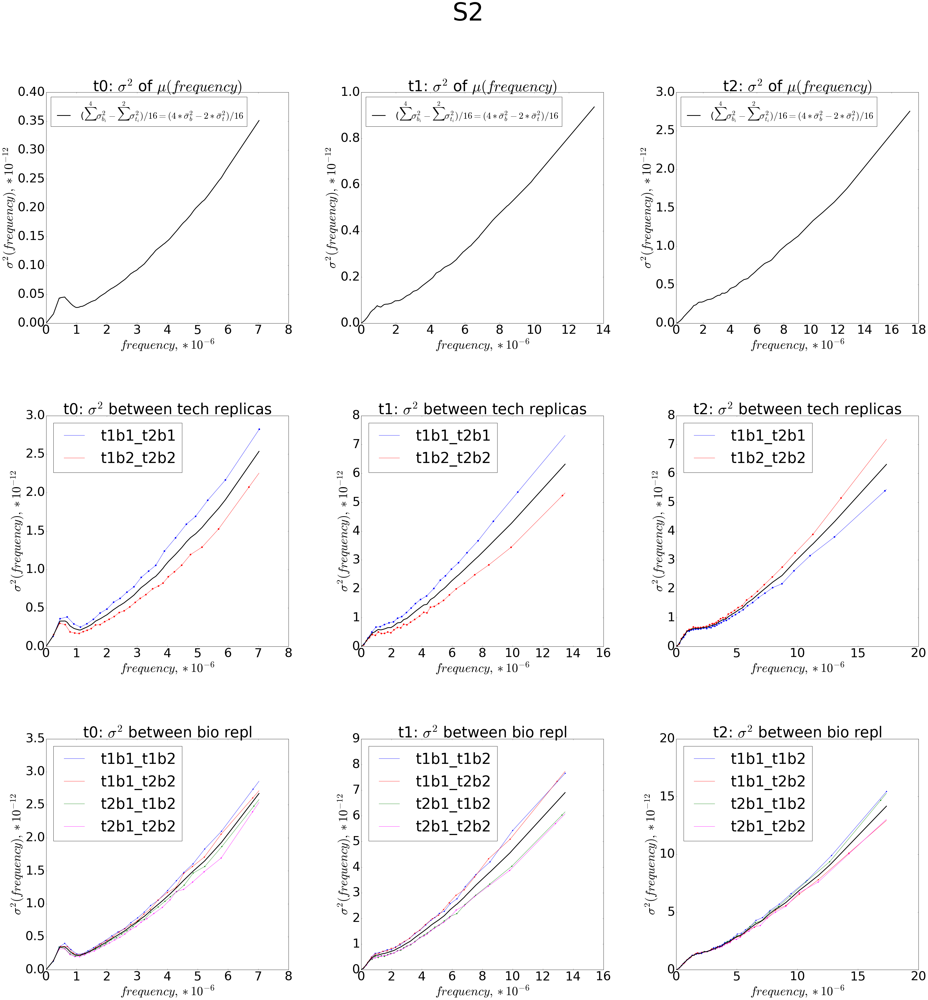

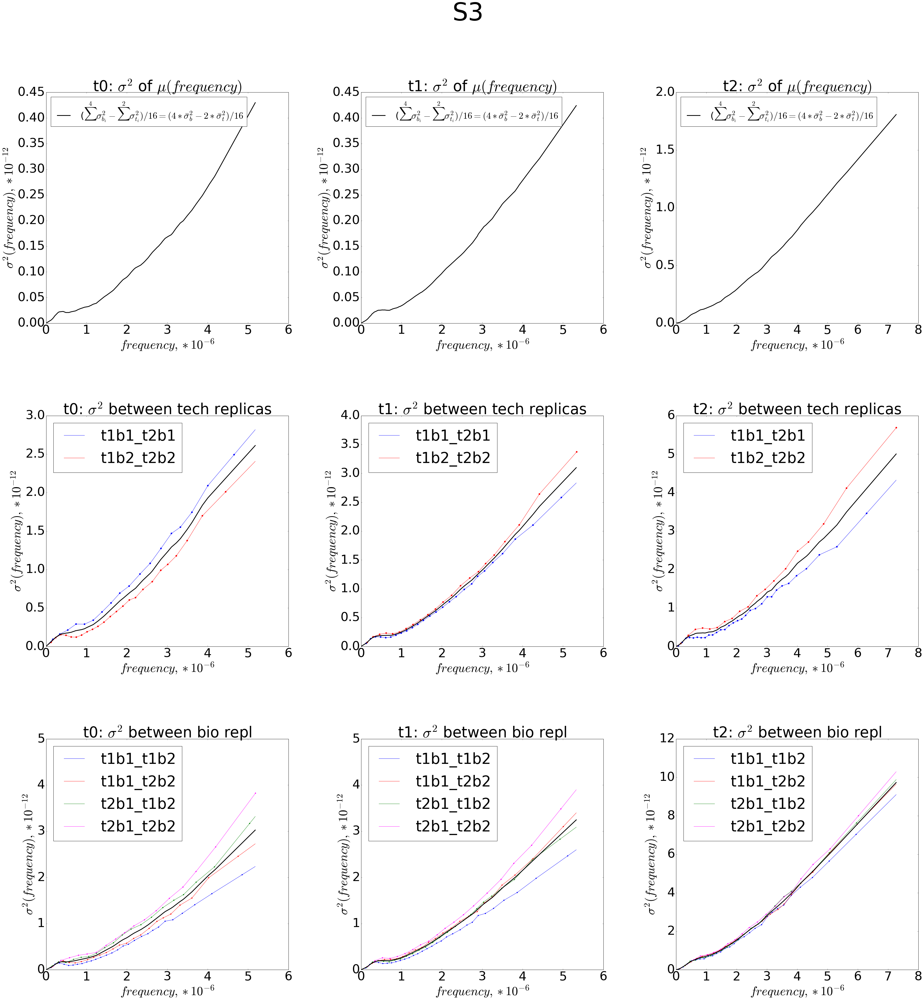

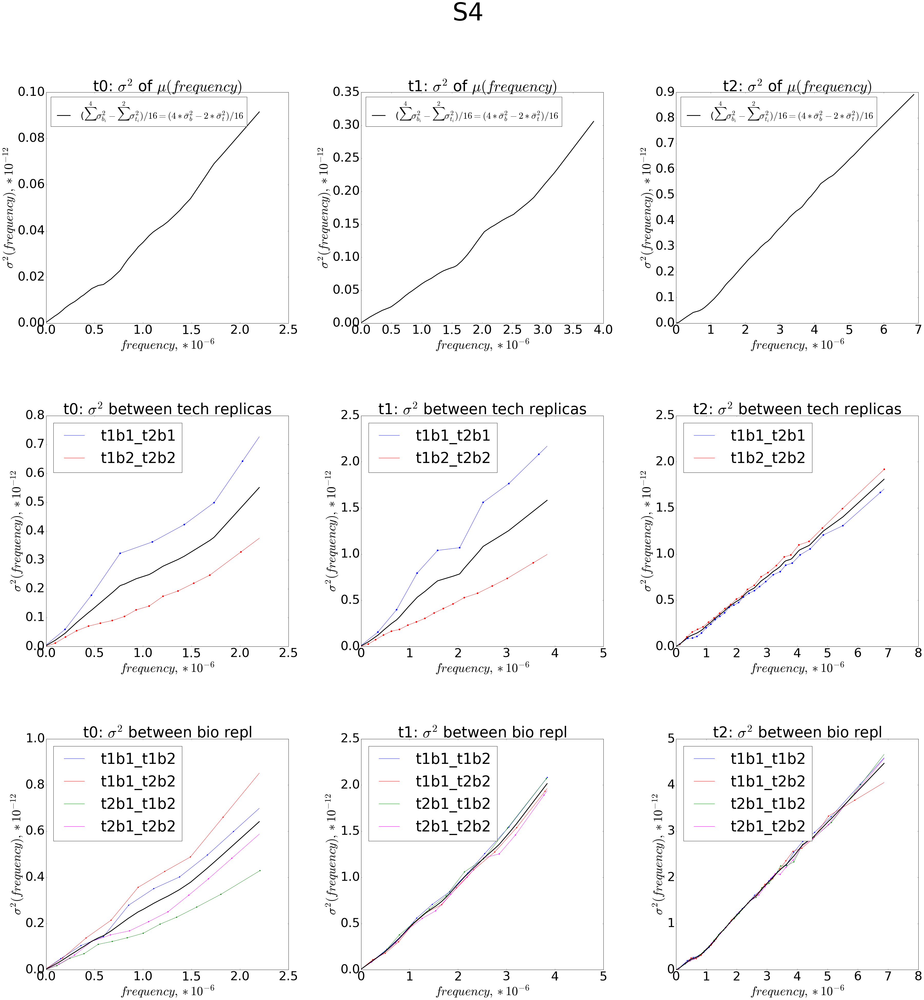

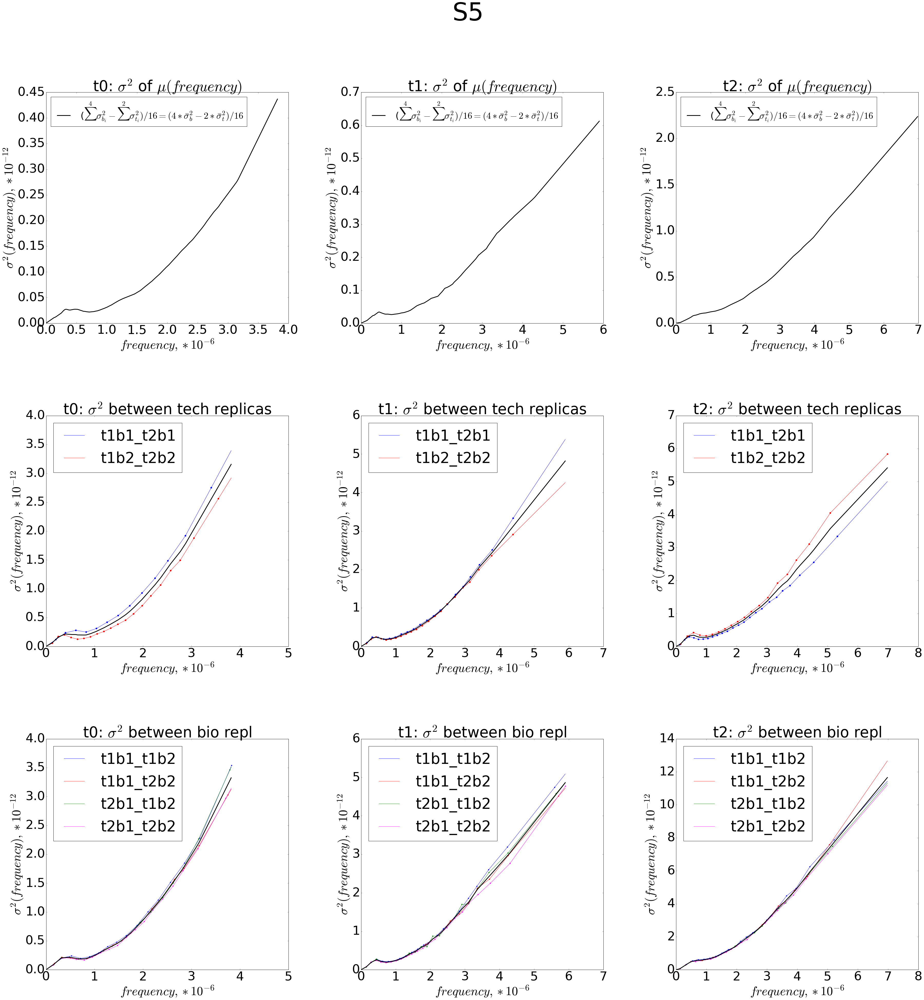

...

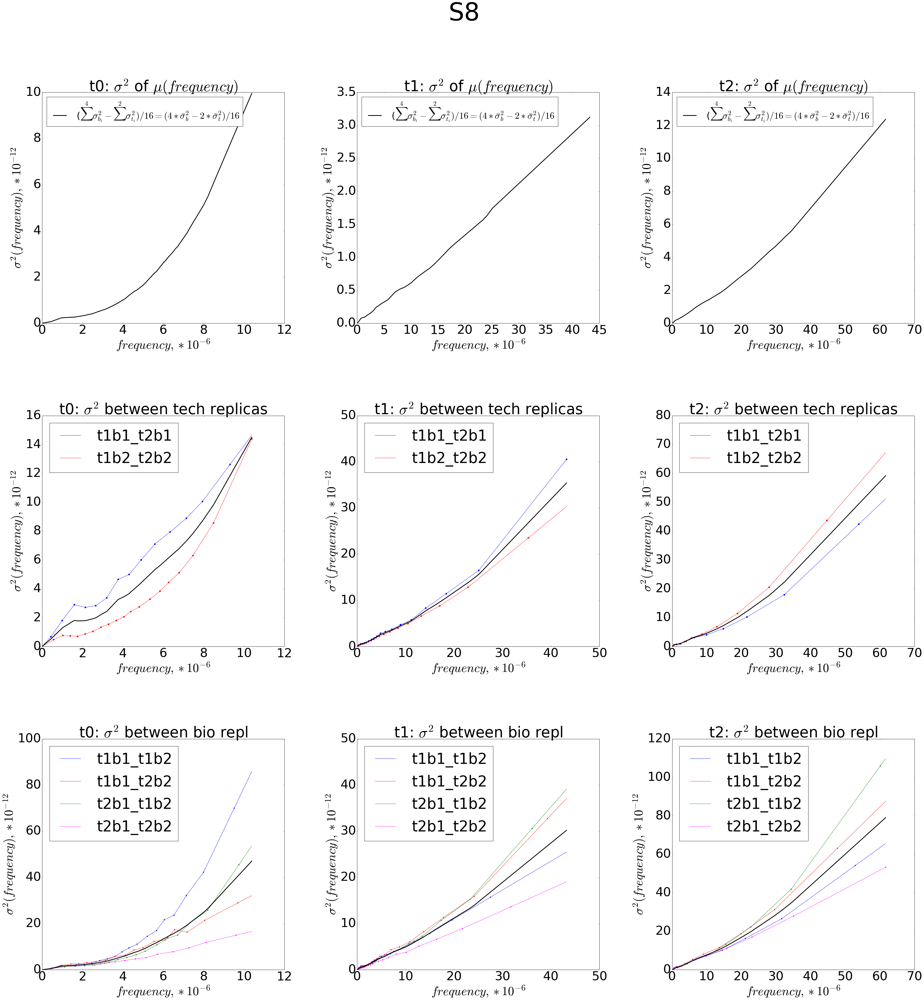

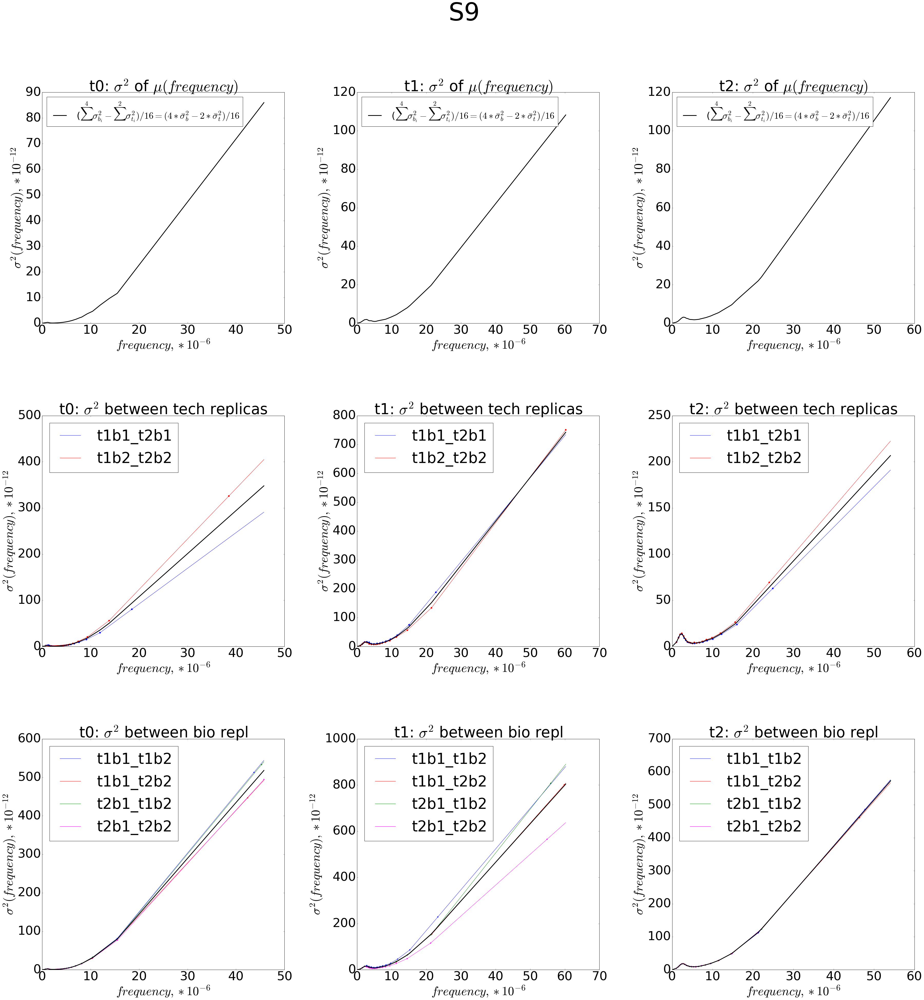

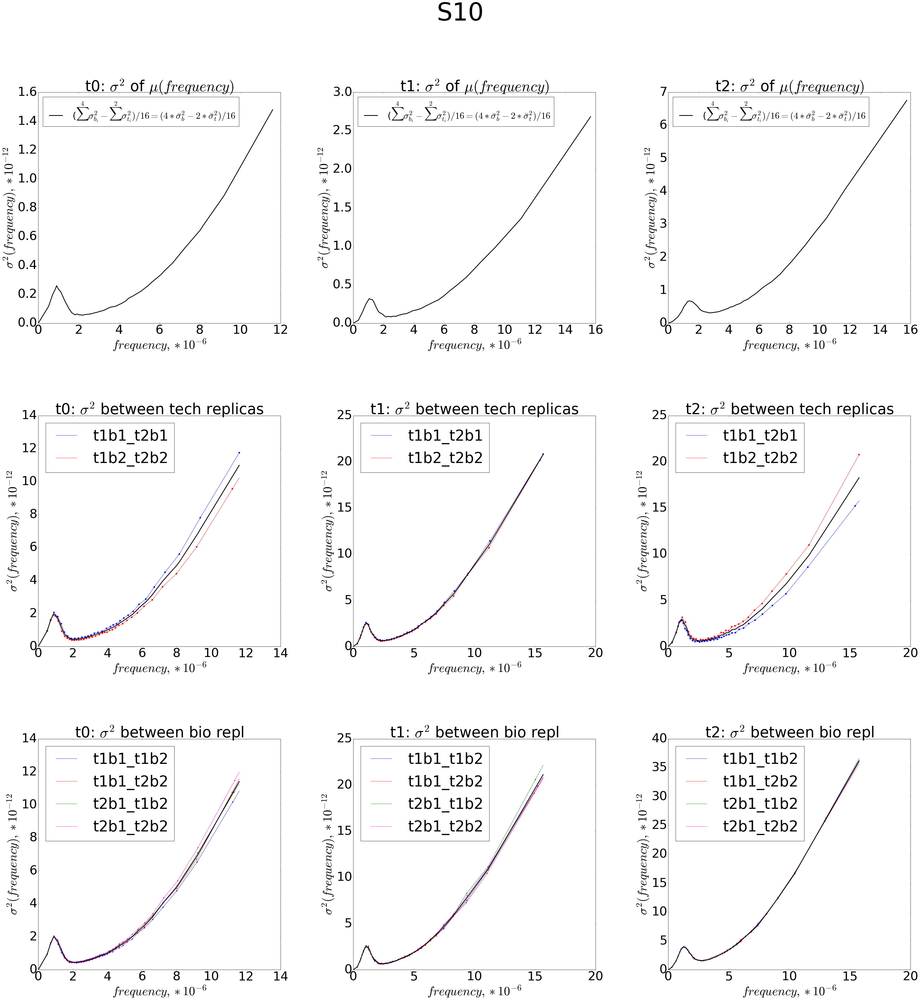

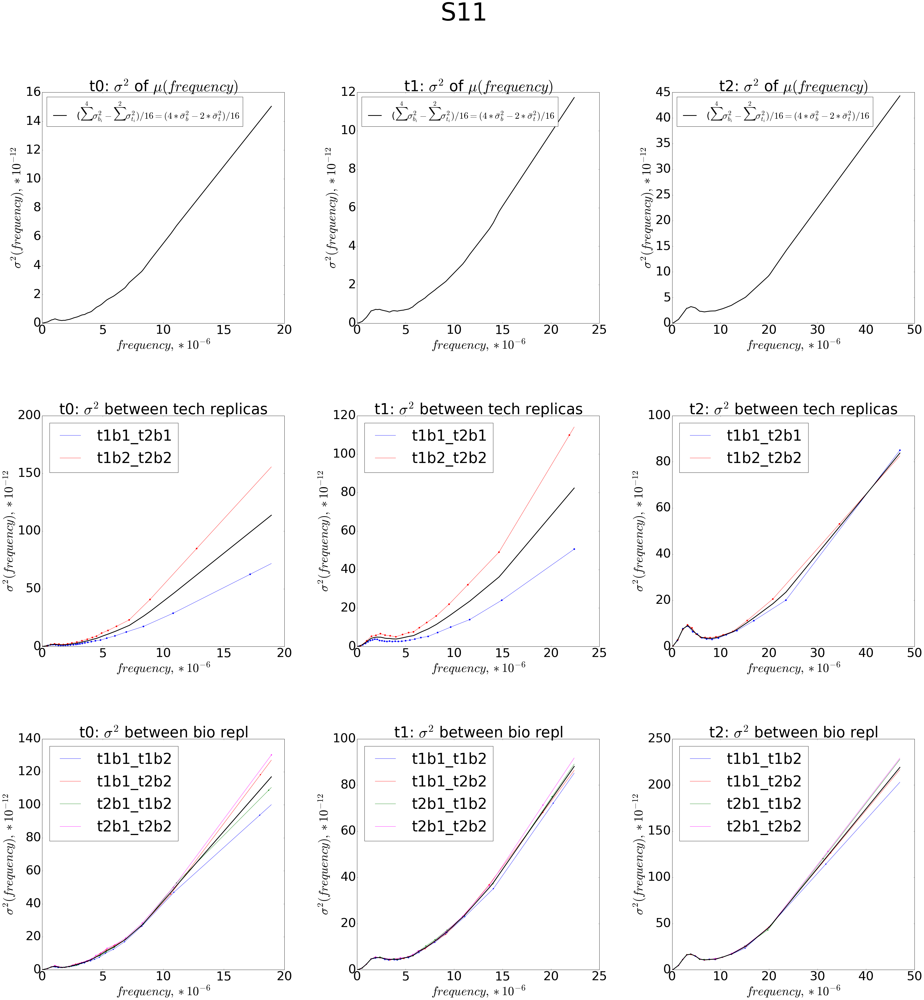

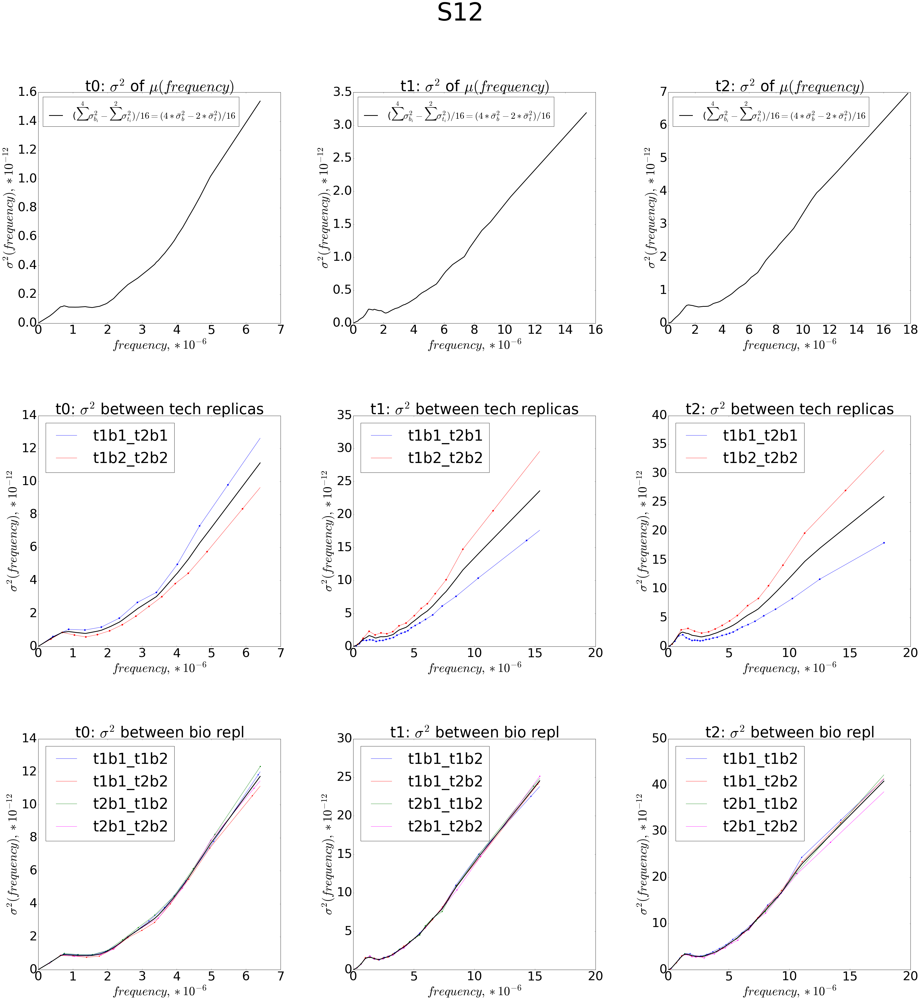

In [11]:
#calculate frequency variance as function of frequency
for s in segm_set:
    print s
    start=time.time()
    
    dfmv=calculate_variance(replicas_all[s],s)
    dfmv.to_csv(data_folder+'/S'+str(s)+'_variance_estimate_sum_10.csv', sep='\t')
    
    end=time.time()
    print s, (end-start)
    start=time.time()
    
    for t in ['t0','t1','t2']:
        for reps in [['tech1_bio1','tech2_bio1'],['tech1_bio2','tech2_bio2'],\
            ['tech1_bio1','tech1_bio2'],['tech1_bio1','tech2_bio2'],['tech2_bio1','tech1_bio2'],['tech2_bio1','tech2_bio2']]:
            dfmv.loc[t,reps[0]+'_'+reps[1]+'_i']=interpolate.UnivariateSpline(dfmv.loc[t,reps[0]+'_'+reps[1]+'_m'],\
                                                                          dfmv.loc[t,reps[0]+'_'+reps[1]+'_v'],k=1,s=0)
    fig=plot_variance(dfmv,s)
    fig.savefig('Figure_Variance/S'+str(s)+'_variance_as_function_of_frequency_sum_10.png', bbox_inches='tight')

    end=time.time()
    print s, (end-start)


### calculate variance for each genotype

In [12]:
#download variance vs frequency data
dfmv_all =range(13)
def array_from_string(string):
    for ch in ["[","]","\r\n"]:
        string=string.replace(ch,'')
    array = [float(s) for s in string.split()] 
    return array

for s in segm_set:
    dfmv=pd.read_csv(data_folder+'/S'+str(s)+'_variance_estimate_sum_10.csv', sep='\t',index_col=0)
    for columns in dfmv.columns.values:
        for indexs in ['t0','t1','t2']:
            dfmv.set_value(indexs, columns, array_from_string(dfmv.loc[indexs,columns]))
    for t in ['t0','t1','t2']:
        for reps in [['tech1_bio1','tech2_bio1'],['tech1_bio2','tech2_bio2'],\
            ['tech1_bio1','tech1_bio2'],['tech1_bio1','tech2_bio2'],['tech2_bio1','tech1_bio2'],['tech2_bio1','tech2_bio2']]:
            dfmv.loc[t,reps[0]+'_'+reps[1]+'_i']=interpolate.UnivariateSpline(dfmv.loc[t,reps[0]+'_'+reps[1]+'_m'],\
                                                                          dfmv.loc[t,reps[0]+'_'+reps[1]+'_v'],k=1,s=0)
    dfmv_all[s]=dfmv

In [13]:
#calculate variance for mean frequency
for s in segm_set:
    for t in ['t0','t1','t2']:
        dfmv=dfmv_all[s]
        xnew=replicas_all[s][t+'_fr_mean']
        ynewt=(dfmv.loc[t,'tech1_bio1_tech2_bio1_i'](xnew)+dfmv.loc[t,'tech1_bio2_tech2_bio2_i'](xnew))/2.
        ynewb=(dfmv.loc[t,'tech1_bio1_tech1_bio2_i'](xnew)+dfmv.loc[t,'tech1_bio1_tech2_bio2_i'](xnew)\
               +dfmv.loc[t,'tech2_bio1_tech1_bio2_i'](xnew)+dfmv.loc[t,'tech2_bio1_tech2_bio2_i'](xnew))/4.
        replicas_all[s][t+'_fr_mean_var']=(ynewb*4.-ynewt*2.)/16.

In [14]:
#calculate variance for median
for s in segm_set:
    for t in ['t0','t1','t2']:
        dfmv=dfmv_all[s]
        xnew=replicas_all[s][t+'_fr_median']
        ynewt=(dfmv.loc[t,'tech1_bio1_tech2_bio1_i'](xnew)+dfmv.loc[t,'tech1_bio2_tech2_bio2_i'](xnew))/2.
        ynewb=(dfmv.loc[t,'tech1_bio1_tech1_bio2_i'](xnew)+dfmv.loc[t,'tech1_bio1_tech2_bio2_i'](xnew)\
               +dfmv.loc[t,'tech2_bio1_tech1_bio2_i'](xnew)+dfmv.loc[t,'tech2_bio1_tech2_bio2_i'](xnew))/4.
        replicas_all[s][t+'_fr_median_var']=(ynewb*4.-ynewt*2.)/16.

In [15]:
#calculate variance for _fr
for s in segm_set:
    for t in ['t0','t1','t2']:
        dfmv=dfmv_all[s]
        xnew=replicas_all[s][t+'_fr']
        ynewt=(dfmv.loc[t,'tech1_bio1_tech2_bio1_i'](xnew)+dfmv.loc[t,'tech1_bio2_tech2_bio2_i'](xnew))/2.
        ynewb=(dfmv.loc[t,'tech1_bio1_tech1_bio2_i'](xnew)+dfmv.loc[t,'tech1_bio1_tech2_bio2_i'](xnew)\
               +dfmv.loc[t,'tech2_bio1_tech1_bio2_i'](xnew)+dfmv.loc[t,'tech2_bio1_tech2_bio2_i'](xnew))/4.
        replicas_all[s][t+'_fr_var']=(ynewb*4.-ynewt*2.)/16.

In [20]:
#compare correlation of w01 vs w12 calculated by fr_mean, fr_median, fr
for s in segm_set:
    mask=replicas_all[s][(replicas_all[s]['t1_fr_mean']!=0)&(replicas_all[s]['t0_fr_mean']!=0)&\
                        (replicas_all[s]['t1_fr_median']!=0)&(replicas_all[s]['t0_fr_median']!=0)]
    pr_mean=stats.spearmanr(mask['t2_fr_mean']/mask['t1_fr_mean'], mask['t1_fr_mean']/mask['t0_fr_mean'])[0]
    pr_median=stats.spearmanr(mask['t2_fr_median']/mask['t1_fr_median'], mask['t1_fr_median']/mask['t0_fr_median'])[0]
    pr=stats.spearmanr(mask['t2_fr']/mask['t1_fr'], mask['t1_fr']/mask['t0_fr'])[0]
    print 'S'+str(s),round(pr_mean,3),round(pr_median,3),round(pr,3)

S1 0.557 0.543 0.56
S2 0.609 0.61 0.618
S3 0.208 0.198 0.207
S4 0.074 0.062 0.076
S5 0.015 0.008 0.017
S6 0.665 0.666 0.673
S7 0.752 0.784 0.784
S8 0.582 0.706 0.706
S9 0.056 0.046 0.068
S10 0.048 0.03 0.046
S11 0.56 0.545 0.555
S12 0.402 0.395 0.398


Median instead of Mean improves S8,S7; a bit spoils others; fr is almost as good as the best of two scores

In [17]:
#save frequencies and variance (mean and median) 
for s in segm_set:
    replicas_all[s].to_csv(data_folder+'/S'+str(s)+'_merged_filtered_sum_10_size_4_with_fr.csv',sep='\t')

### some plots about comparison fr_mean, fr_median, fr. Do not need

In [73]:
def func_plot_mean_vs_median(replicas_all,segment,t,sample_size=10000):
    plt.figure(figsize=(4*5,3*5))
    plt.rcParams.update({'font.size': 12})
    plt.subplots_adjust(hspace = 0.4,wspace=0.3)
    plt.suptitle(t,fontsize=24)
    count=1
    for s in segm_set:
        mask=replicas_all[s].sample(sample_size)
        plt.subplot(3,4,count)
        plt.scatter(mask[t+'_fr_mean'],mask[t+'_fr_median'],edgecolor='',alpha=0.5)
        plt.title('S'+str(s))
        plt.xlabel('mean')
        plt.ylabel('median')
        count+=1

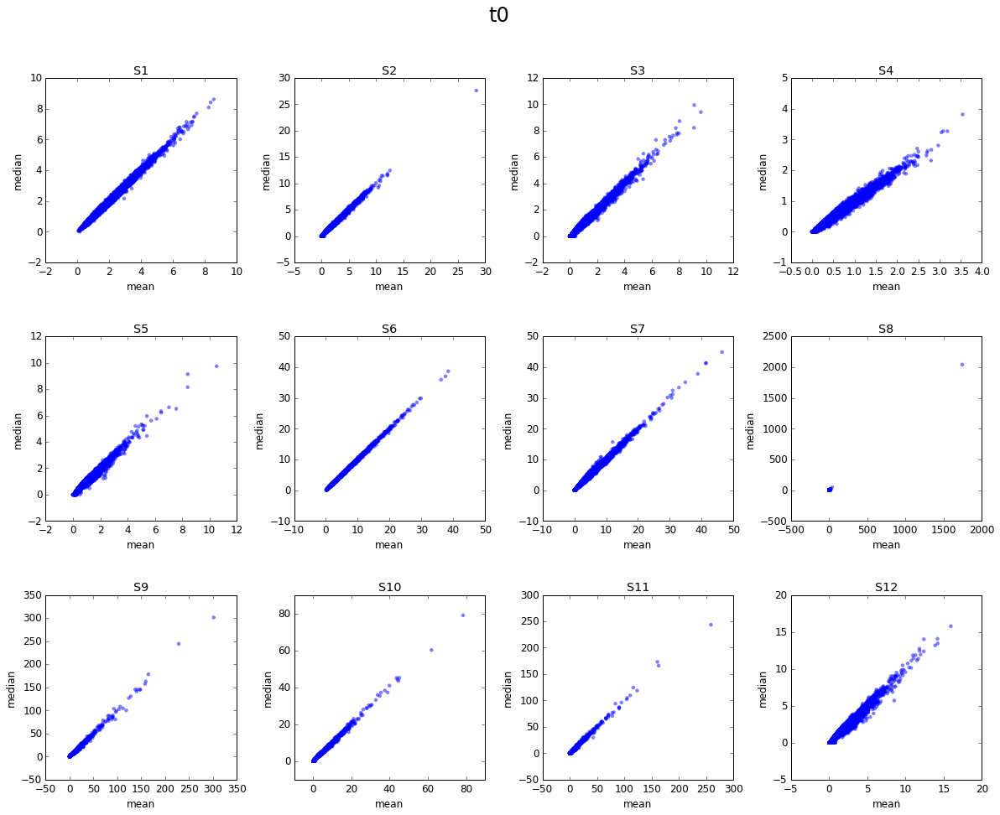

In [74]:
func_plot_mean_vs_median(replicas_all,segment,'t0')

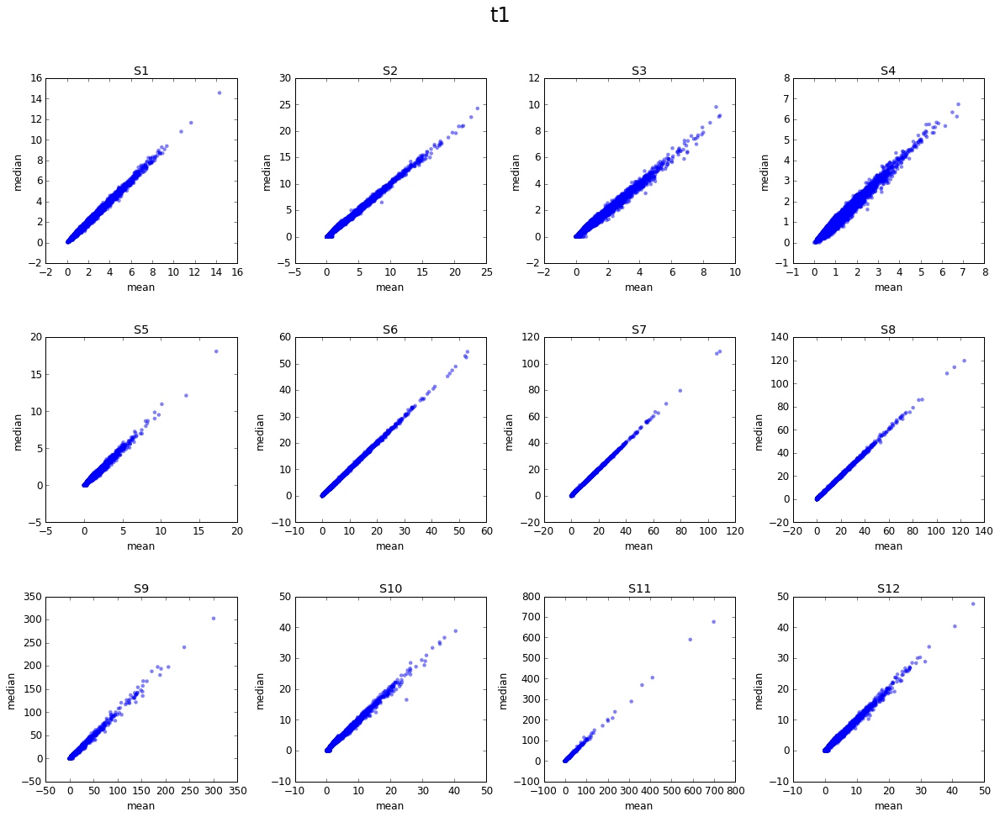

In [75]:
func_plot_mean_vs_median(replicas_all,segment,'t1')

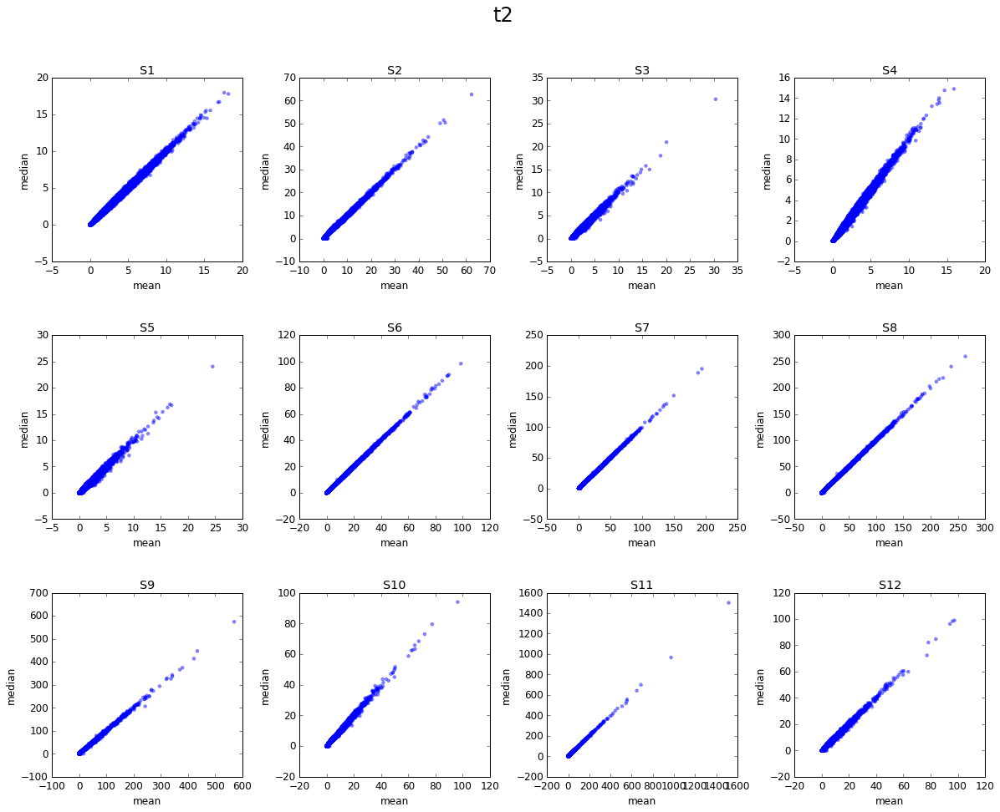

In [76]:
func_plot_mean_vs_median(replicas_all,segment,'t2',50000)

In [46]:
#here I just look how median and mean differ for wt
s=3
replicas_all[s][replicas_all[s]['t2_fr_mean']-replicas_all[s]['t2_fr_median']>10]\
[['t0_fr_mean','t0_fr_var','t0_fr_median','t0_fr_median_var',\
 't1_fr_mean','t1_fr_var','t1_fr_median','t1_fr_median_var',\
 't2_fr_mean','t2_fr_var','t2_fr_median','t2_fr_median_var']]

,t0_fr_mean,t0_fr_var,t0_fr_median,t0_fr_median_var,t1_fr_mean,t1_fr_var,t1_fr_median,t1_fr_median_var,t2_fr_mean,t2_fr_var,t2_fr_median,t2_fr_median_var
574430,156.251589,19.786671,127.749336,16.131534,1067.75511,135.42361,1039.84086,131.876648,1291.891082,411.850623,1166.072524,371.688951


In [41]:
replicas_all[s][replicas_all[s]['t2_fr_mean']-replicas_all[s]['t2_fr_median']>10]

,seq,aa_seq,t0_tech1_bio1,t1_tech1_bio1,t2_tech1_bio1,t0_tech1_bio2,t1_tech1_bio2,t2_tech1_bio2,t0_tech2_bio1,t1_tech2_bio1,t2_tech2_bio1,t0_tech2_bio2,t1_tech2_bio2,t2_tech2_bio2,total_tech1,total_tech2,min_read_tech1,min_read_tech2,size,t0_tech1_bio1_fr,t0_tech1_bio2_fr,t0_tech2_bio1_fr,t0_tech2_bio2_fr,t0_fr_mean,t1_tech1_bio1_fr,t1_tech1_bio2_fr,t1_tech2_bio1_fr,t1_tech2_bio2_fr,t1_fr_mean,t2_tech1_bio1_fr,t2_tech1_bio2_fr,t2_tech2_bio1_fr,t2_tech2_bio2_fr,t2_fr_mean,t0_fr_var,t1_fr_var,t2_fr_var,t0_fr_median,t1_fr_median,t2_fr_median,t0_fr_median_var,t1_fr_median_var,t2_fr_median_var
882640,TCGAACAGGCCGTACGCAGTTGTCGAACTTGGTTTGCAAAGGGAGA...,SNRPYAVVELGLQREKVGDLSCEMIPHF,17716.0,64713.0,43641.0,35654.0,19494.0,729697.0,17285.0,61243.0,121418.0,190261.0,64467.0,33277.0,910915.0,487951.0,5752.228384,3215.286549,4,2007.524705,2454.788759,1531.63891,12014.387131,4502.084876,10075.614205,1700.846165,5764.635187,5419.647527,5740.185771,3213.659892,58024.193731,7798.757651,2251.02154,17821.908204,410.059108,478.865634,4022.881657,2231.156732,5592.141357,5506.208771,203.077926,466.509982,1242.138278



spearman improves significantly for S8 and S7,S4, for others plus minus a bit

In [59]:
for s in segm_set:
    mask=replicas_all[s][(replicas_all[s]['t1_fr_mean']!=0)&(replicas_all[s]['t0_fr_mean']!=0)&\
                        (replicas_all[s]['t1_fr_median']!=0)&(replicas_all[s]['t0_fr_median']!=0)]
    pr_mean=stats.spearmanr(mask['t2_fr_mean']/mask['t1_fr_mean'], mask['t1_fr_mean']/mask['t0_fr_mean'])[0]
    pr_median=stats.spearmanr(mask['t2_fr_median']/mask['t1_fr_median'], mask['t1_fr_median']/mask['t0_fr_median'])[0]
    print s,pr_mean,pr_median

1 0.638262695086 0.630474831959
2 0.6585703625 0.670825046317
3 0.443902243149 0.439180935546
4 0.721811772782 0.77505064188
5 0.185192238917 0.181274071897
6 0.710859807389 0.717104108104
7 0.747211809296 0.793795786512
8 0.25032405063 0.44753158674
9 0.0740175923911 0.0604418938262
10 0.0915900518509 0.0683659934506
11 0.646137109453 0.651268681495
12 0.696321095082 0.701325895226


##### my conclusion:
for majority mean and median are the same. Mean supposed to be more accurate than median for big dataset. But median would save from outliers. I will try to use median in further analysis